## Color + Gradient experiment

In [2]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib qt
%matplotlib inline
import os
import random

### Compute camera calibration matrix and distortion coefficients from chessboard images

In [3]:
# Calibrate from camera calibration images and get distortion coeffs.
def calibrate(visualize=False):
    """
    Calibrates images by chessboard corners and return distortion coefficients.
    
    Args:
        visualize: if true, draw and display corners for each images.
        
    Returns:
        A tuple of (mtx, dist) representing distortion coefficients.
    """
    Y_CORNERS = 6
    X_CORNERS = 9
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(9,6,0)
    objp = np.zeros((Y_CORNERS*X_CORNERS, 3), np.float32)
    objp[:,:2] = np.mgrid[0:X_CORNERS, 0:Y_CORNERS].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Make a list of calibration images
    calib_images = glob.glob('./camera_cal/calibration*.jpg')
    
    # Step through the list and search for chessboard corners
    for fname in calib_images:
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (X_CORNERS, Y_CORNERS), None)
        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
            if visualize:
                # Draw and display the corners
                drawn_img = cv2.drawChessboardCorners(img, (X_CORNERS, Y_CORNERS), corners, ret)
                cv2.imshow('drawn_img', drawn_img)
                cv2.waitKey(500)

    cv2.destroyAllWindows()
    
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None) 
    return mtx, dist

# Store distortion coefficients as global variables.
MTX, DIST = calibrate(visualize=False)

def undistort(image, mtx=MTX, dist=DIST):
    """
    Undistorts image by distortion coefficients.
    
    Args:
        image: input image
        mtx, dist: distortion coefficients from cv2.calibrateCamera.
    
    Returns:
        Undistorted image.
    """
    return cv2.undistort(image, mtx, dist, None, mtx)

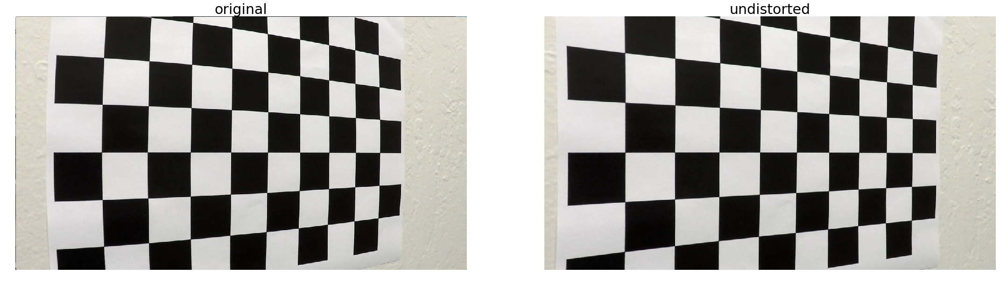

In [36]:
images = []
titles = []
for fname in glob.glob('./camera_cal/calibration*.jpg'):
    images.append(read_image(fname))
    titles.append('original')      
    images.append(undistort(images[-1]))
    titles.append('undistorted')

plot_images(images[:2], titles[:2], columns=2)

### Apply a distortion correction to raw images.

In [4]:
def plot_images(images, titles, columns, cmap=plt.jet()):
    """
    Plot images with titles in grids.
    """
    rows = (len(images) + columns - 1) // columns
    fig, axs = plt.subplots(rows, columns, figsize=(20*columns, 10*rows))
    fig.subplots_adjust(hspace=.2, wspace=.03)
    axs = axs.ravel()
    for idx, image in enumerate(images):
        axs[idx].axis('off')
        axs[idx].imshow(image, cmap)
        axs[idx].set_title(titles[idx], fontsize=30)

def read_image(image_path):
    """
    Reads image file into a RGB ndarray.
    """
    return cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)

# Apply distortion correction to test images.
IMGS = []
IMG_NAMES = []
UNDIST_IMGS = []

images = []
titles = []
for fname in sorted(glob.glob('./test_images/*.jpg')):
    IMGS.append(read_image(fname))
    images.append(IMGS[-1])
    IMG_NAMES.append(os.path.basename(fname))
    titles.append(IMG_NAMES[-1])
    titles.append('Undistorted {}'.format(titles[-1]))
    UNDIST_IMGS.append(undistort(IMGS[-1]))
    images.append(UNDIST_IMGS[-1])

<Figure size 432x288 with 0 Axes>

### Apply a perspective transform to rectify binary image ("birds-eye view").

In [6]:
# Image size height = 720, width = 1280.
H, W = 720, 1280
# Define region from points (x, y).
SRC_REGION = np.float32(
    [(570, 465),   # top-left
     (200, 720),   # bottom-left
     (710, 465),   # top-right
     (1080, 720),  # bottom-right
    ])
OFFSET = 450
DST_REGION = np.float32([
    (OFFSET, 0),
    (OFFSET, H),
    (W - OFFSET, 0),
    (W - OFFSET, H)])

def unwarp(image, src=SRC_REGION, dst=DST_REGION):
    """
    Unwarps image by doing persepctive transformation from |src| region to |dst| region.
    
    Args:
        src: source region.
        dst: destination region.
        
    Returns:
        unwarp: unwarpped image.
        M: the transform matrix from |src| to |dst|.
        Minv: the tranform matrix from |dst| to |src|.
    """
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(image, M, (W, H)) #, flags=cv2.INTER_LINEAR)
    return warped, M, Minv

UNWARP_IMGS = []

for undist_img in UNDIST_IMGS:
    unwarp_img, _, _ = unwarp(undist_img)
    UNWARP_IMGS.append(unwarp_img)

### Use color transforms, gradients, etc., to create a thresholded binary image.

In [7]:
# Visualize image in different color spaces.
def plot_image_colorspaces(image):
    """Input image must be RGB."""
    images = []
    titles = []
    # RGB
    # Red channel
    images.append(image[:,:,0])
    titles.append('RGB R-channel')
    # Green channel
    images.append(image[:,:,1])
    titles.append('RGB G-channel')
    # Blue channel
    images.append(image[:,:,2])
    titles.append('RGB B-channel')
    # HLS
    hls_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    # H channel
    images.append(hls_image[:,:,0])
    titles.append('HLS H-channel')
    # L channel
    images.append(hls_image[:,:,1])
    titles.append('HLS L-channel')
    # S channel
    images.append(hls_image[:,:,2])
    titles.append('HLS S-channel')
    # HSV
    hsv_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    # H channel
    images.append(hsv_image[:,:,0])
    titles.append('HSV H-channel')
    # S channel
    images.append(hsv_image[:,:,1])
    titles.append('HSV S-channel')
    # V channel
    images.append(hsv_image[:,:,2])
    titles.append('HSV V-channel')
    # LAB
    lab_image = cv2.cvtColor(image, cv2.COLOR_RGB2Lab)
    # L channel
    images.append(lab_image[:,:,0])
    titles.append('LAB L-channel')
    # a channel
    images.append(lab_image[:,:,1])
    titles.append('LAB a-channel')
    # b channel
    images.append(lab_image[:,:,2])
    titles.append('Lab b-channel')
    
    plot_images(images, titles, columns=3, cmap='gray')

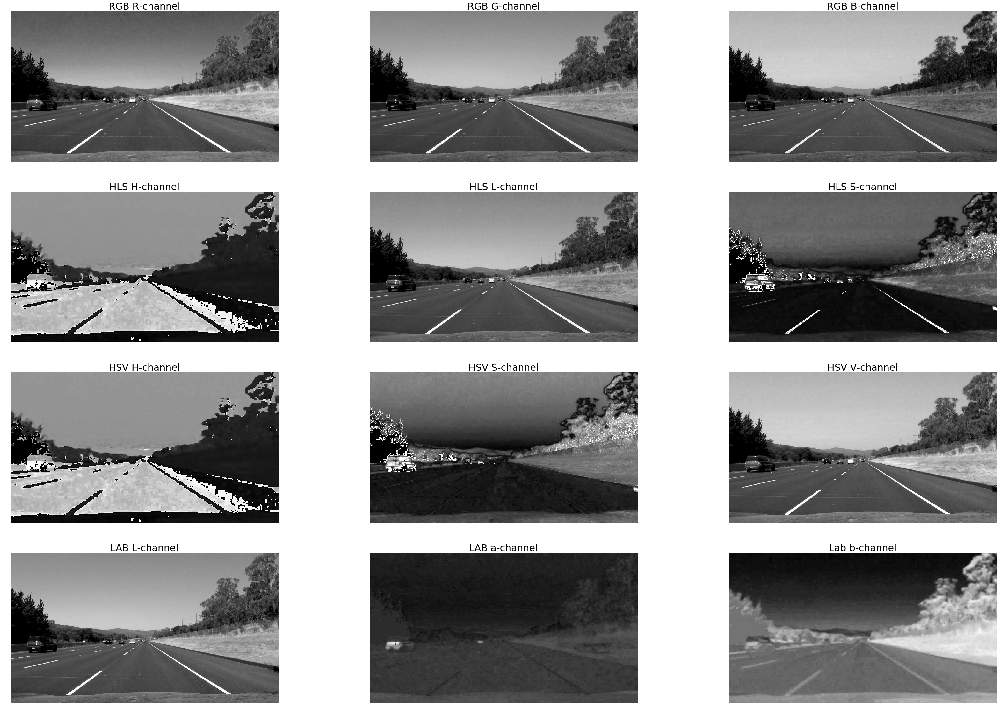

In [9]:
plot_image_colorspaces(IMGS[1])

<function __main__.tune_sobel_x_thresh(min_thresh, max_thresh)>

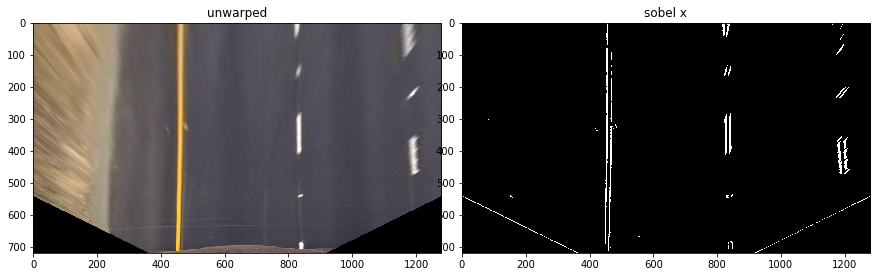

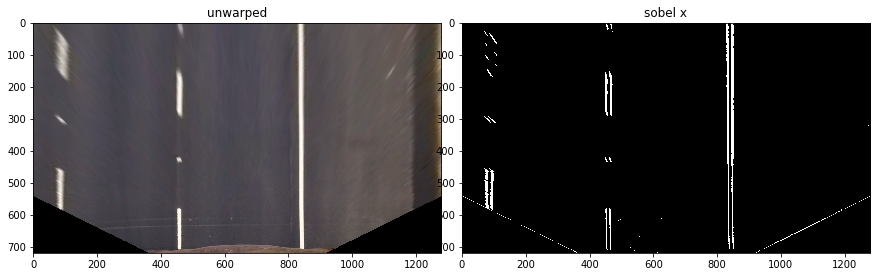

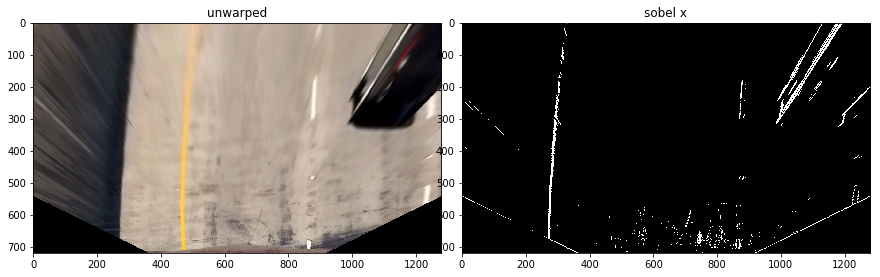

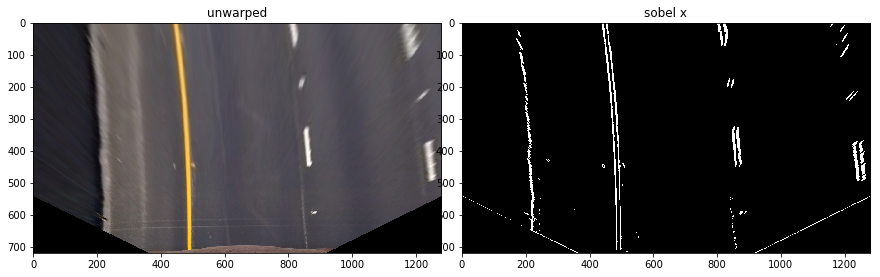

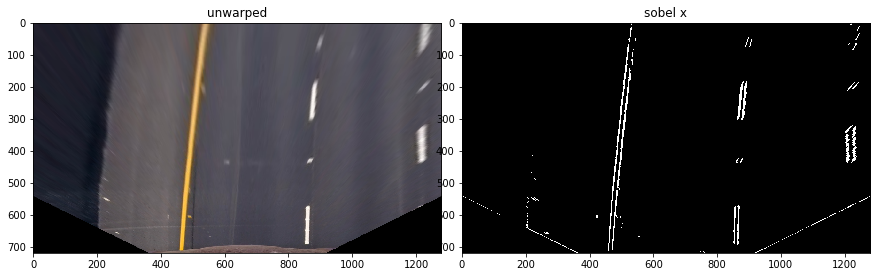

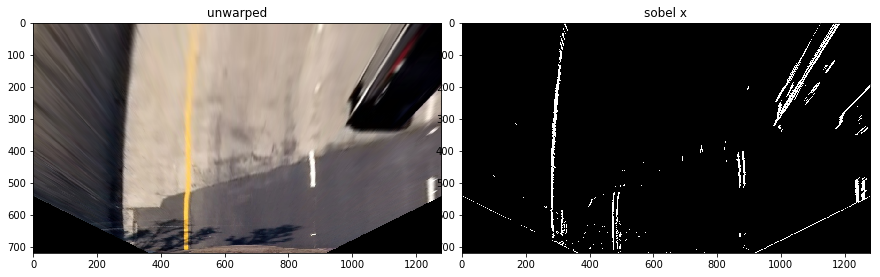

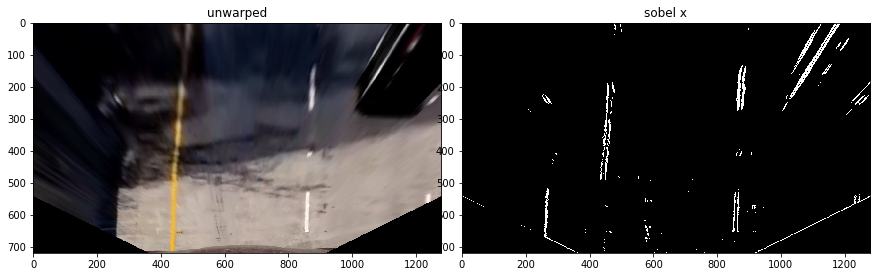

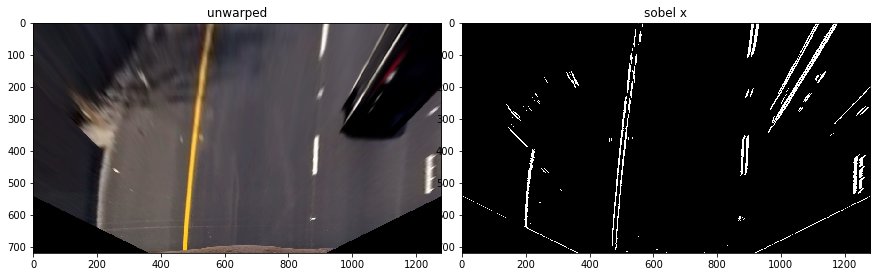

In [12]:
from ipywidgets import interact, interactive, fixed, IntSlider, FloatSlider

# Sobel on x or y orientation with threshold.
def sobel_ori_thresh(image, orient, thresh_min, thresh_max):
#     gray = (cv2.cvtColor(image, cv2.COLOR_RGB2GRAY))
    hls_l = (cv2.cvtColor(image, cv2.COLOR_RGB2HLS))[:,:,1]
        
    sobel = cv2.Sobel(hls_l, cv2.CV_64F, orient=='x', orient=='y')
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    return binary_output

def tune_sobel_x_thresh(min_thresh, max_thresh):
    def plot(image):
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 8))
        f.subplots_adjust(hspace = .2, wspace=.05)
        ax1.imshow(image)
        ax1.set_title('unwarped')
        thesh_image = sobel_ori_thresh(image, 'x', min_thresh, max_thresh)
        ax2.imshow(thesh_image, cmap='gray')
        ax2.set_title('sobel x')
    for wnwarp_img in UNWARP_IMGS:
        plot(wnwarp_img)

interact(tune_sobel_x_thresh, 
         min_thresh=IntSlider(min=0, max=255, value=30, continuous_update=False), 
         max_thresh=IntSlider(min=0, max=255, value=255, continuous_update=False))

<function __main__.tune_soble_mag_thresh(min_thresh, max_thresh)>

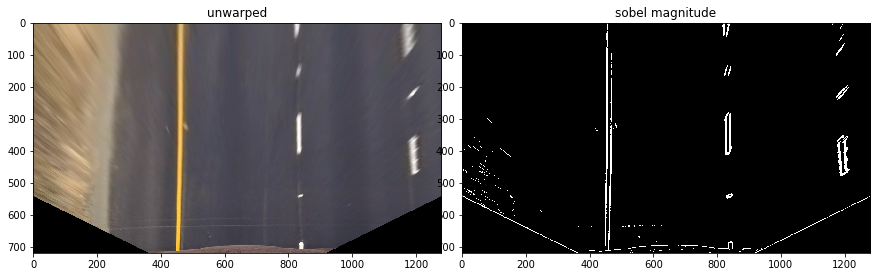

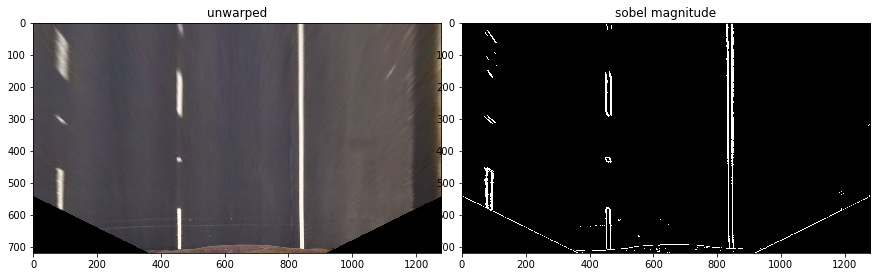

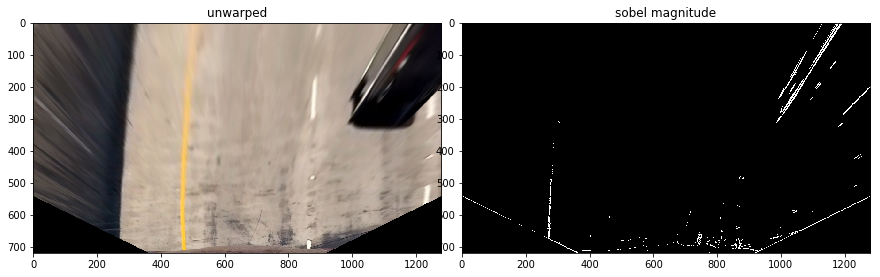

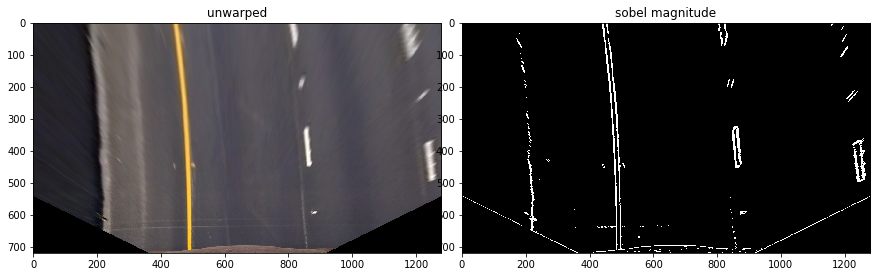

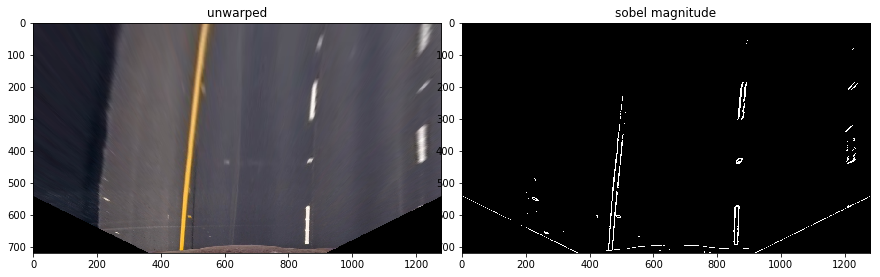

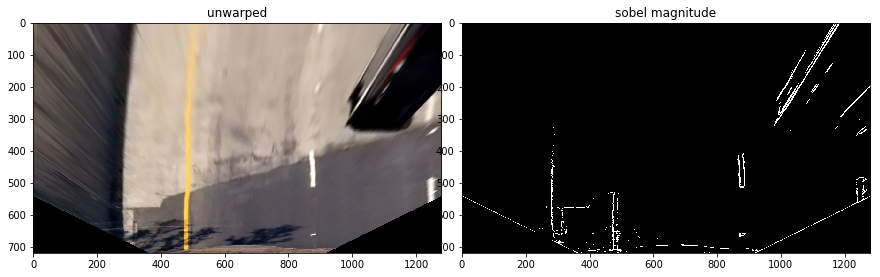

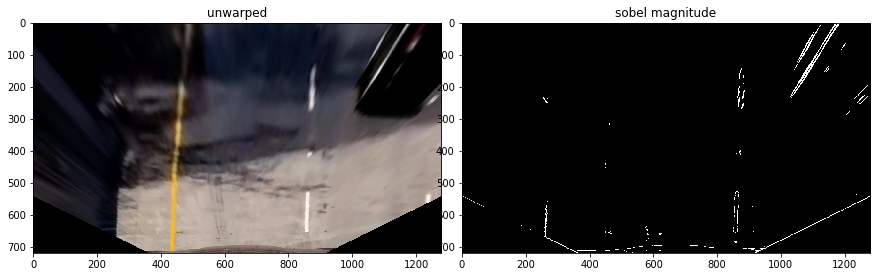

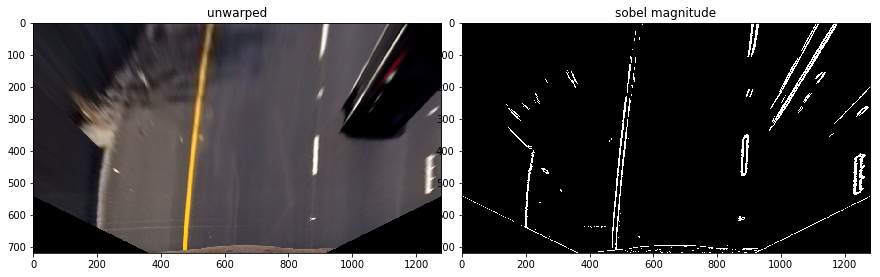

In [14]:
# Sobel x and y magnitude
def soble_mag_thresh(image, min_thresh, max_thresh):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    mag_sobel = np.sqrt(np.square(sobelx) + np.square(sobely))
    scaled_sobel = np.uint8(255*mag_sobel/np.max(mag_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= min_thresh) & (scaled_sobel <= max_thresh)] = 1
    return binary_output

# TODO: use partial to wrap
def tune_soble_mag_thresh(min_thresh, max_thresh):
    def plot(image):
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 8))
        f.subplots_adjust(hspace = .2, wspace=.05)
        ax1.imshow(image)
        ax1.set_title('unwarped')
        thesh_image = soble_mag_thresh(image, min_thresh, max_thresh)
        ax2.imshow(thesh_image, cmap='gray')
        ax2.set_title('sobel magnitude')
    for unwarp_img in UNWARP_IMGS:
        plot(unwarp_img)

interact(tune_soble_mag_thresh, 
         min_thresh=IntSlider(min=0, max=255, value=30, continuous_update=False),
         max_thresh=IntSlider(min=0, max=255, value=255, continuous_update=False))

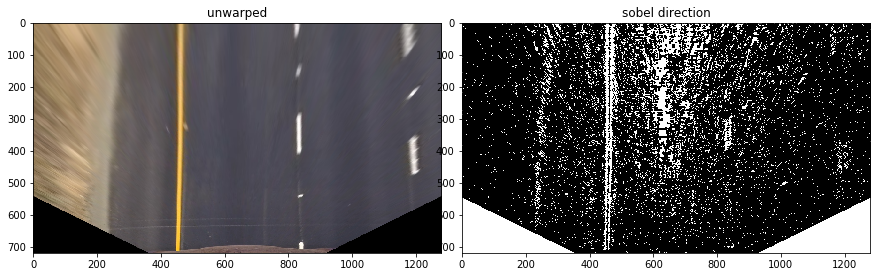

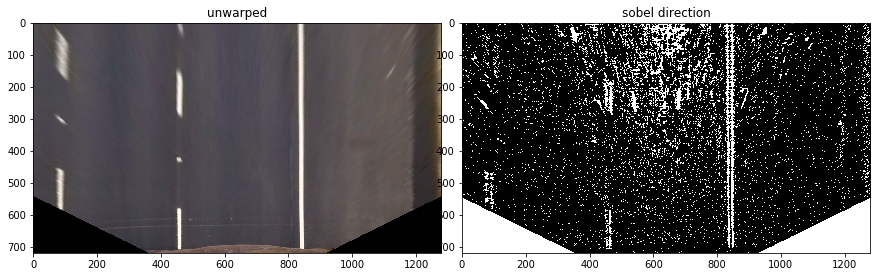

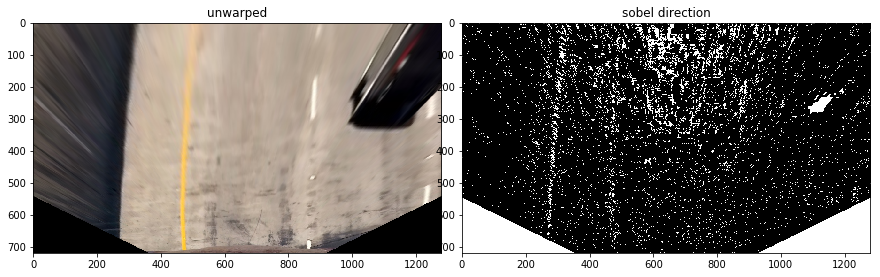

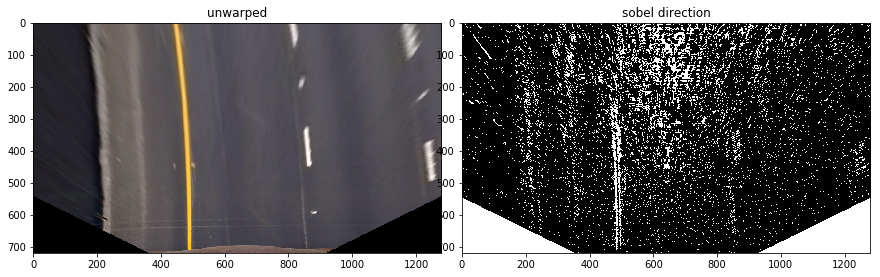

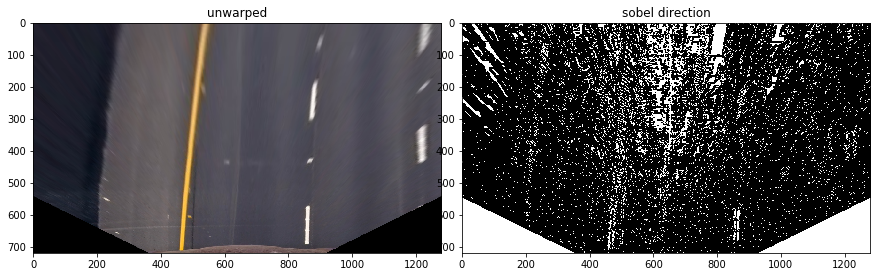

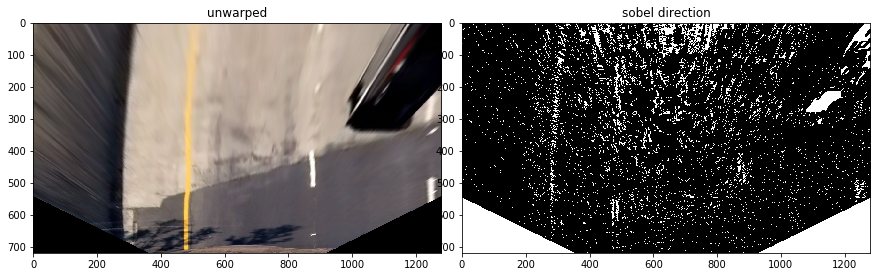

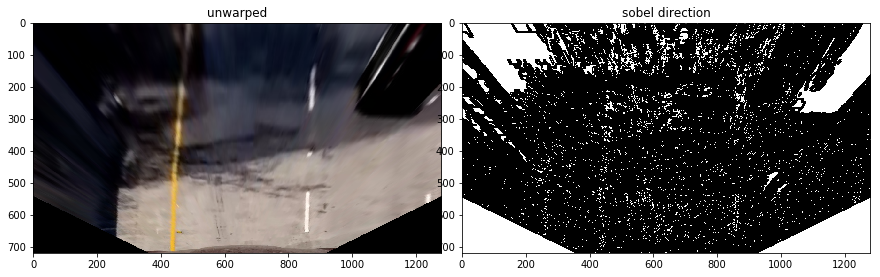

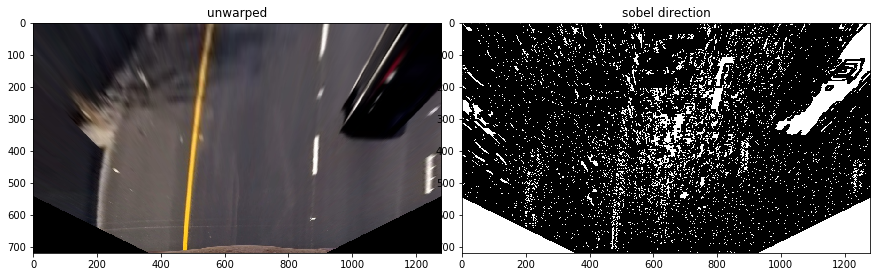

In [18]:
# Sobel direcction
def sobel_dir_thresh(img, min_thresh, max_thresh, sobel_kernel=7):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    grad_dir = np.arctan2(abs_sobely, abs_sobelx)
    binary_output = np.zeros_like(grad_dir)
    binary_output[(grad_dir >= min_thresh) & (grad_dir <= 0.08)] = 1
    return binary_output

def tune_soble_dir_thresh(sobel_kernel, min_thresh, max_thresh):
    def plot(image):
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 8))
        f.subplots_adjust(hspace = .2, wspace=.05)
        ax1.imshow(image)
        ax1.set_title('unwarped')
        thesh_image = sobel_dir_thresh(image, min_thresh, max_thresh, sobel_kernel)
        ax2.imshow(thesh_image, cmap='gray')
        ax2.set_title('sobel direction')
    for unwarp_img in UNWARP_IMGS:
        plot(unwarp_img)

interact(tune_soble_dir_thresh, 
         min_thresh=FloatSlider(min=0, max=np.pi/2, value=0.1, step=0.01, continuous_update=False),
         max_thresh=FloatSlider(min=0, max=np.pi/2, step=0.01, continuous_update=False),
         sobel_kernel=IntSlider(min=1, max=25, continuous_update=False))

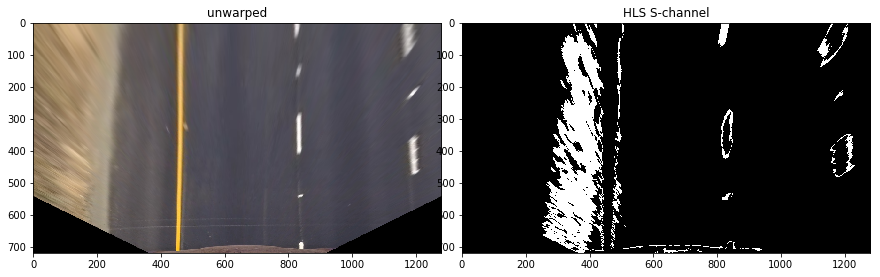

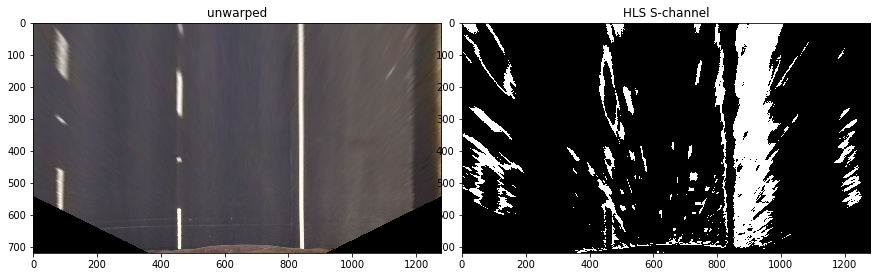

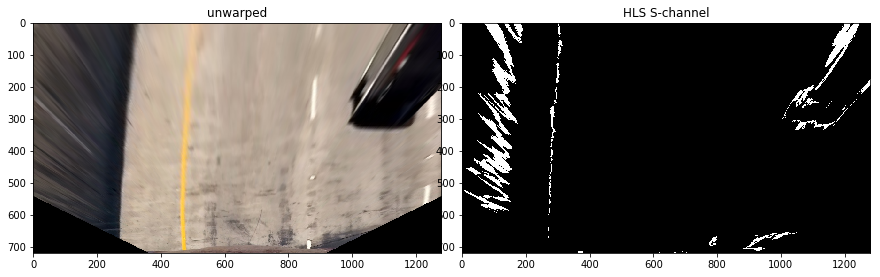

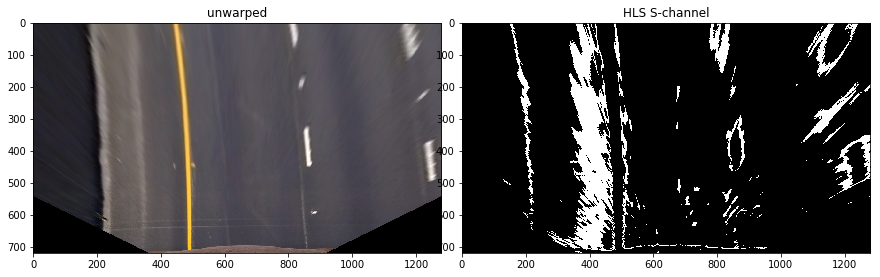

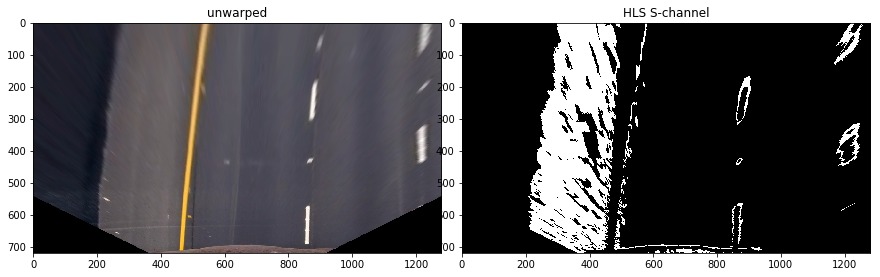

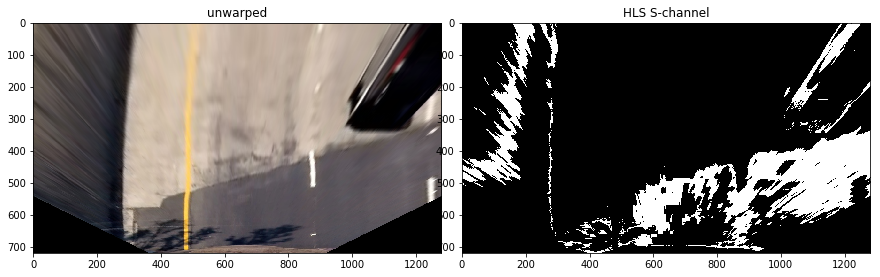

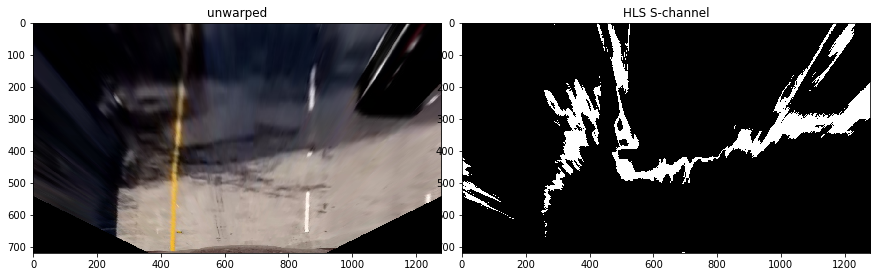

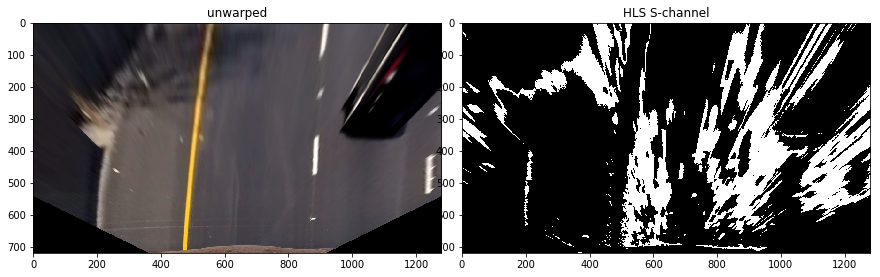

In [19]:
# HLS H threshold
def hls_h_thresh(img, min_thresh, max_thresh):
    hls_h = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)[:,:,0]
    binary_output = np.zeros_like(hls_h)
    binary_output[(hls_h > min_thresh) & (hls_h <= max_thresh)] = 1
    return binary_output

def tune(min_thresh, max_thresh):
    def plot(image):
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 8))
        f.subplots_adjust(hspace = .2, wspace=.05)
        ax1.imshow(image)
        ax1.set_title('unwarped')
        thesh_image = hls_h_thresh(image, min_thresh, max_thresh)
        ax2.imshow(thesh_image, cmap='gray')
        ax2.set_title('HLS S-channel')
    for unwarp_img in UNWARP_IMGS:
        plot(unwarp_img)

interact(tune, 
         min_thresh=IntSlider(min=0, max=255, value=150, continuous_update=False),
         max_thresh=IntSlider(min=0, max=255, value=255, continuous_update=False))

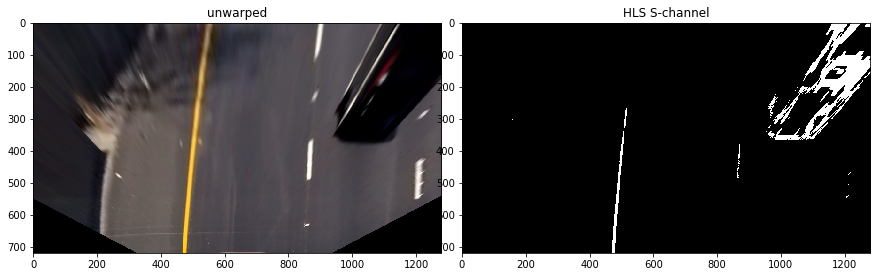

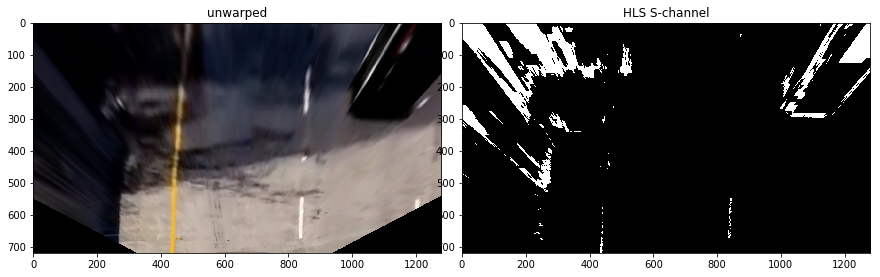

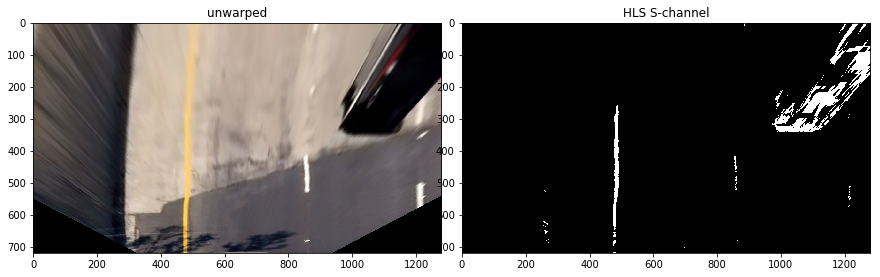

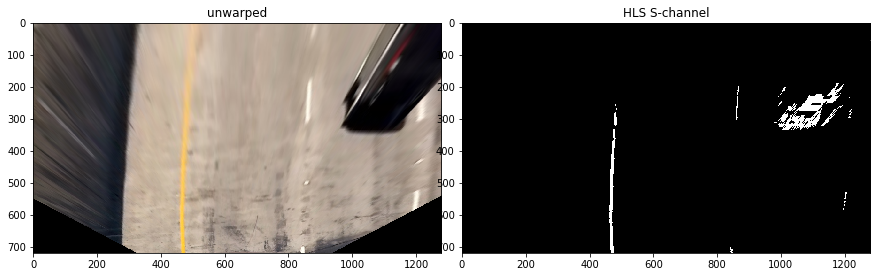

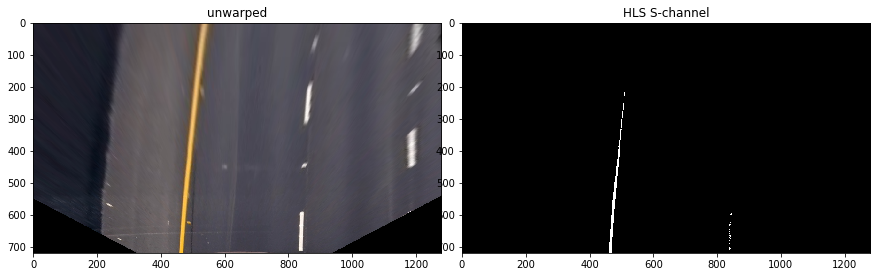

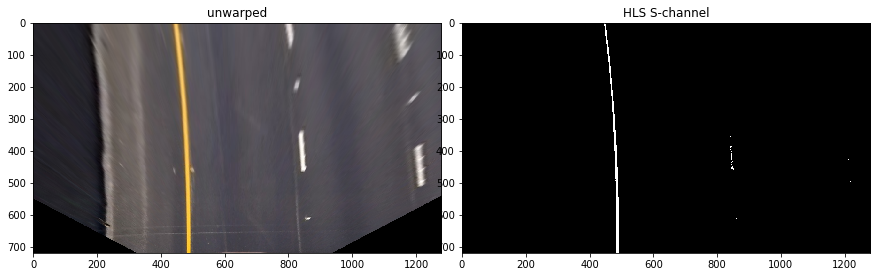

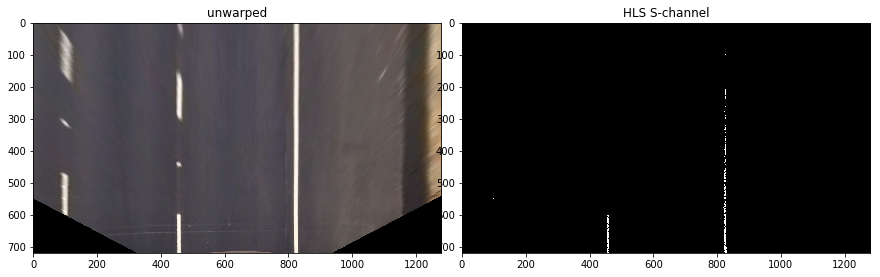

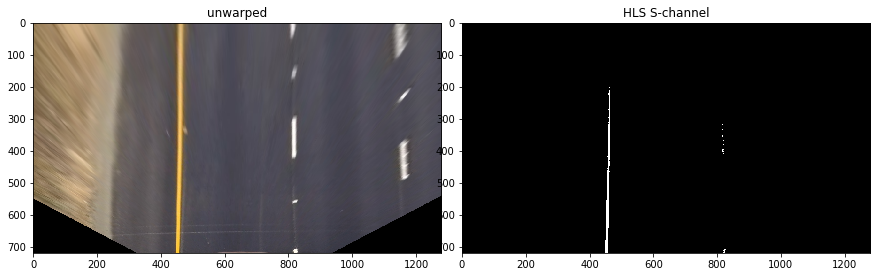

In [9]:
# HLS S threshold
def hls_s_thresh(img, min_thresh=0, max_thresh=255):
    hls_s = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)[:,:,2]
    binary_output = np.zeros_like(hls_s)
    binary_output[(hls_s > min_thresh) & (hls_s <= max_thresh)] = 1
    return binary_output

def tune_hls_s_thresh(min_thresh, max_thresh):
    def plot(image):
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 8))
        f.subplots_adjust(hspace = .2, wspace=.05)
        ax1.imshow(image)
        ax1.set_title('unwarped')
        thesh_image = hls_s_thresh(image, min_thresh, max_thresh)
        ax2.imshow(thesh_image, cmap='gray')
        ax2.set_title('HLS S-channel')
    for unwarped_image in UNWARPED_IMAGES:
        plot(unwarped_image)

interact(tune_hls_s_thresh, 
         min_thresh=IntSlider(min=0, max=255, continuous_update=False),
         max_thresh=IntSlider(min=0, max=255, continuous_update=False))

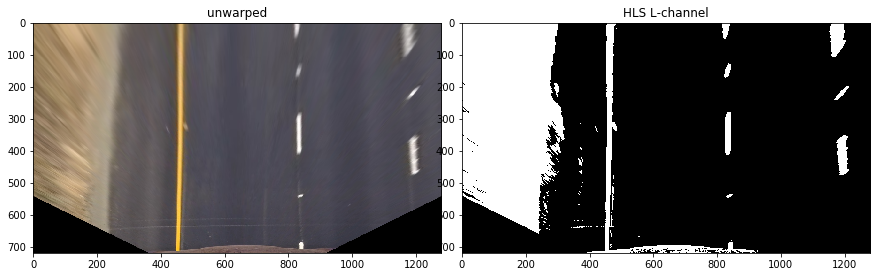

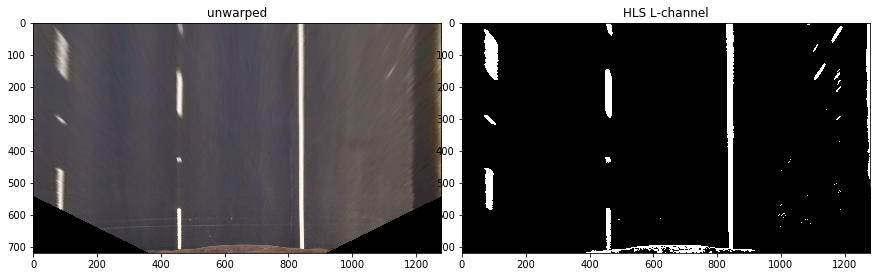

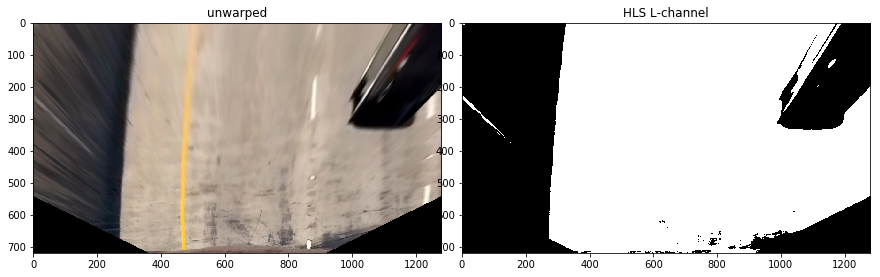

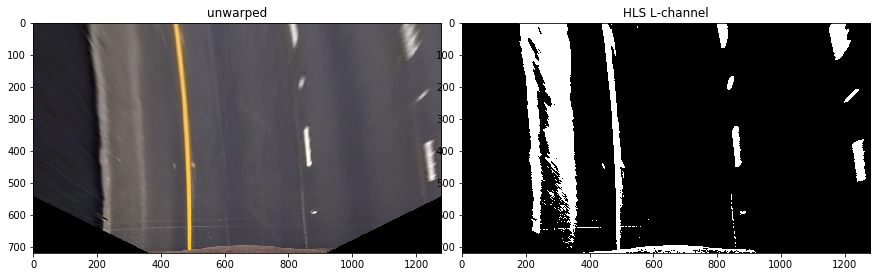

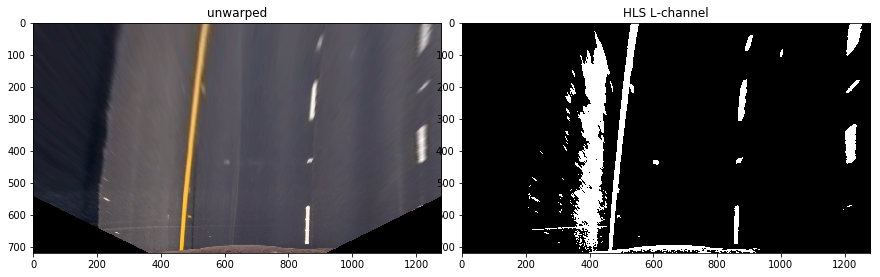

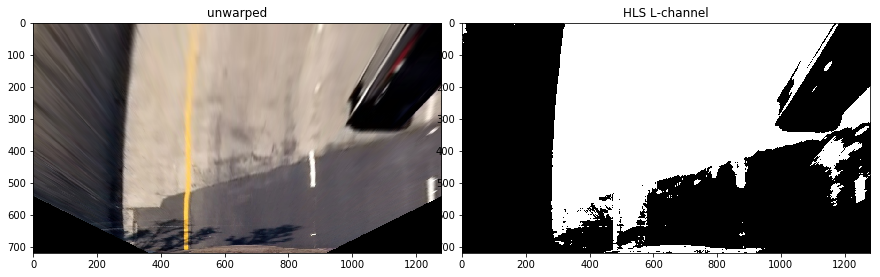

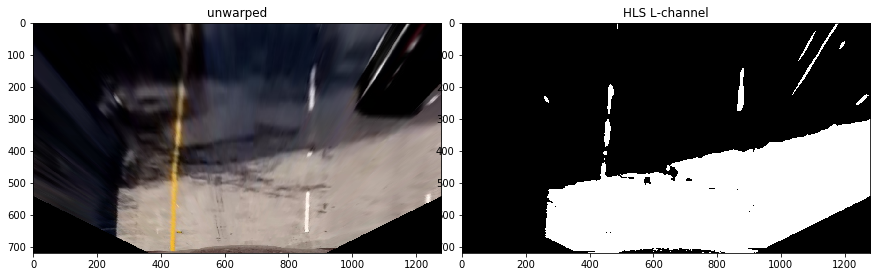

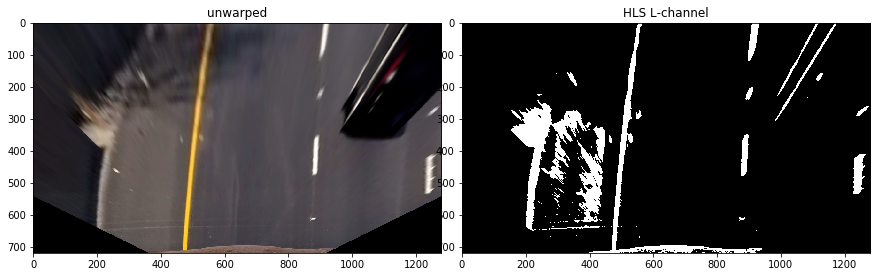

In [22]:
# HLS L threshold
def hls_l_thresh(img, min_thresh, max_thresh):
    hls_l = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)[:,:,1]
    binary_output = np.zeros_like(hls_l)
    binary_output[(hls_l > min_thresh) & (hls_l <= max_thresh)] = 1
    return binary_output

def tune_hls_l_thresh(min_thresh, max_thresh):
    def plot(image):
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 8))
        f.subplots_adjust(hspace = .2, wspace=.05)
        ax1.imshow(image)
        ax1.set_title('unwarped')
        thesh_image = hls_l_thresh(image, min_thresh, max_thresh)
        ax2.imshow(thesh_image, cmap='gray')
        ax2.set_title('HLS L-channel')
    for unwarp_img in UNWARP_IMGS:
        plot(unwarp_img)

interact(tune_hls_l_thresh, 
         min_thresh=IntSlider(min=0, max=255, value=100, continuous_update=False),
         max_thresh=IntSlider(min=0, max=255, value=255, continuous_update=False))

<function __main__.tune_lab_b_thresh(min_thresh, max_thresh)>

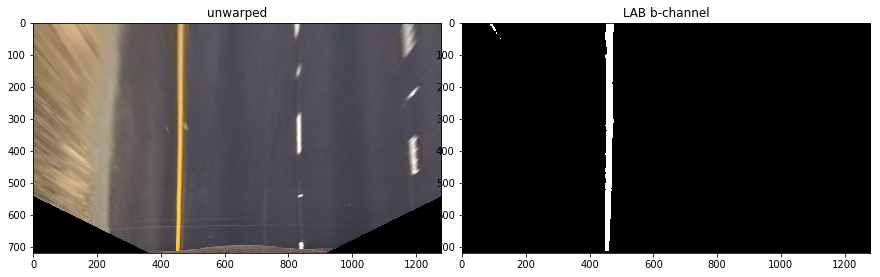

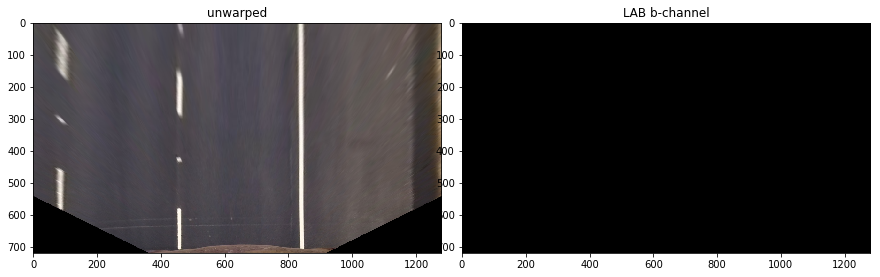

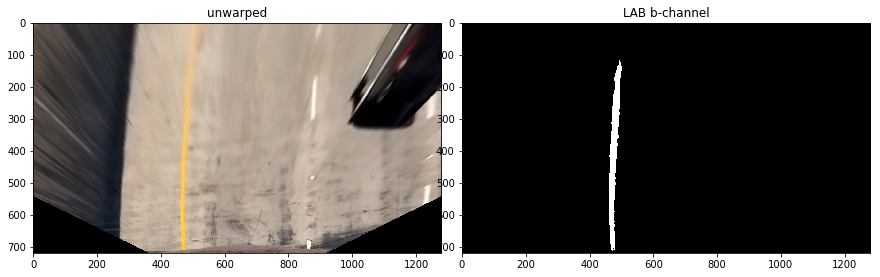

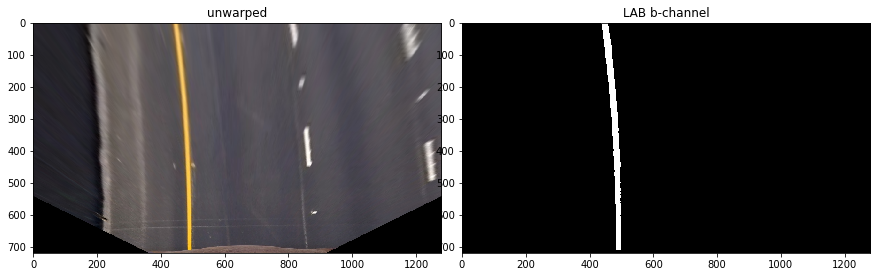

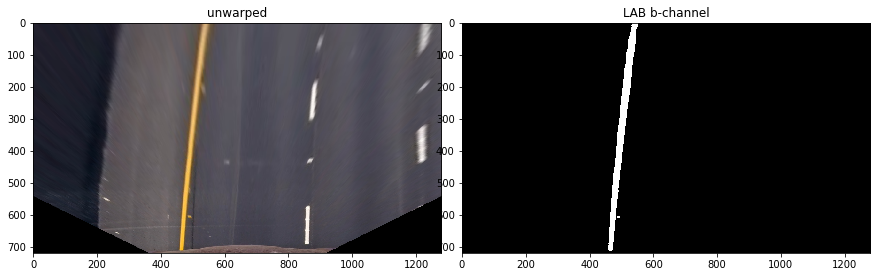

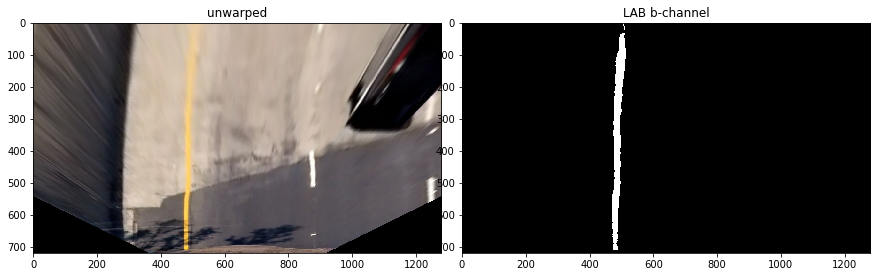

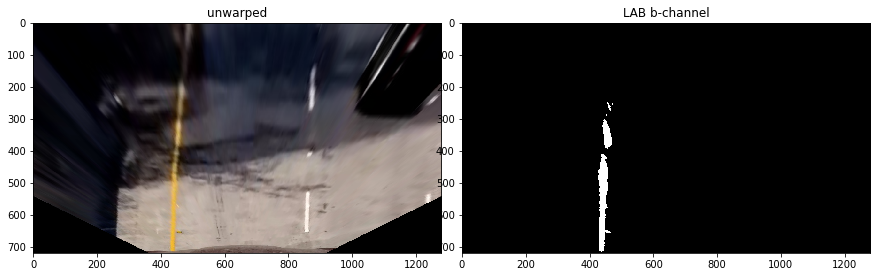

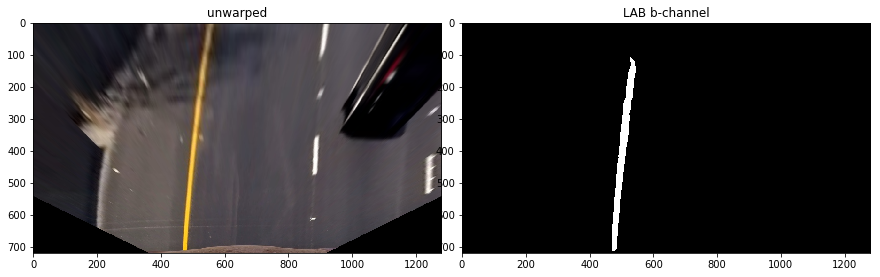

In [20]:
# LAB b threshold
def lab_b_thresh(img, min_thresh, max_thresh):
    lab_b = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)[:,:,2]
    if np.max(lab_b) > 175:
        lab_b = lab_b*(255/np.max(lab_b))
    binary_output = np.zeros_like(lab_b)
    binary_output[(lab_b > min_thresh) & (lab_b <= max_thresh)] = 1
    return binary_output

def tune_lab_b_thresh(min_thresh, max_thresh):
    def plot(image):
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 8))
        f.subplots_adjust(hspace = .2, wspace=.05)
        ax1.imshow(image)
        ax1.set_title('unwarped')
        thesh_image = lab_b_thresh(image, min_thresh, max_thresh)
        ax2.imshow(thesh_image, cmap='gray')
        ax2.set_title('LAB b-channel')
    for unwarp_img in UNWARP_IMGS:
        plot(unwarp_img)

interact(tune_lab_b_thresh, 
         min_thresh=IntSlider(min=0, max=255, value=190, continuous_update=False),
         max_thresh=IntSlider(min=0, max=255, value=255, continuous_update=False))

In [24]:
def binary_thresh(image):
    """Do binary thresholding on image"""
    hls_l_image = hls_l_thresh(image, 207, 255)
    lab_b_image = lab_b_thresh(image, 190, 255)
    binary_image = np.zeros_like(hls_l_image)
    binary_image[(hls_l_image == 1)|(lab_b_image == 1)] = 1
    return binary_image

BINARY_IMGS = []
for unwarp_img in UNWARP_IMGS:
    BINARY_IMGS.append(binary_thresh(unwarp_img))

In [31]:
cv2.imwrite('images/color_thresh.jpg', BINARY_IMGS[0]*255)

True

In [32]:
cv2.imwrite('images/unwarp.jpg', cv2.cvtColor(UNWARP_IMGS[0], cv2.COLOR_RGB2BGR))

True

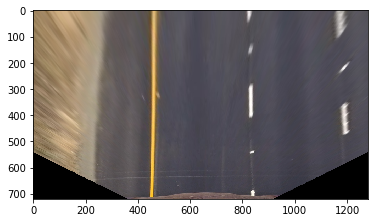

In [30]:
plt.imshow(UNWARP_IMGS[0])

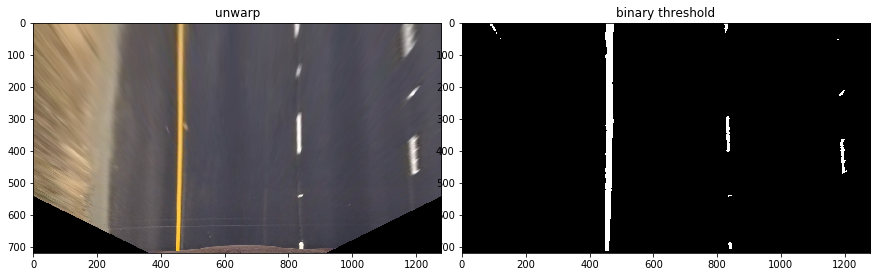

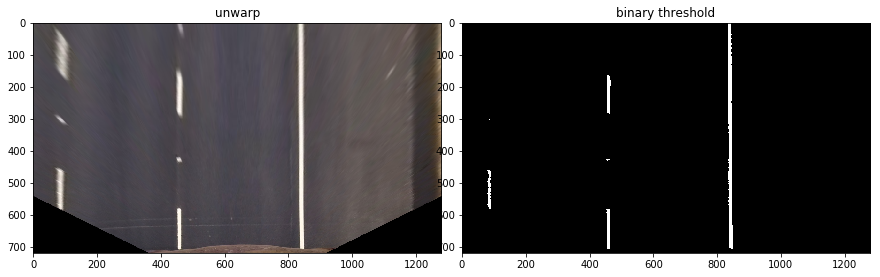

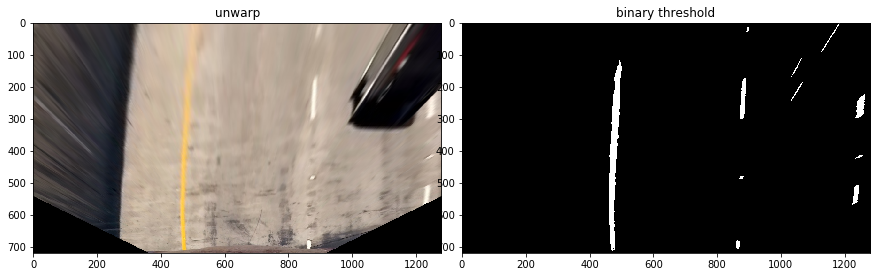

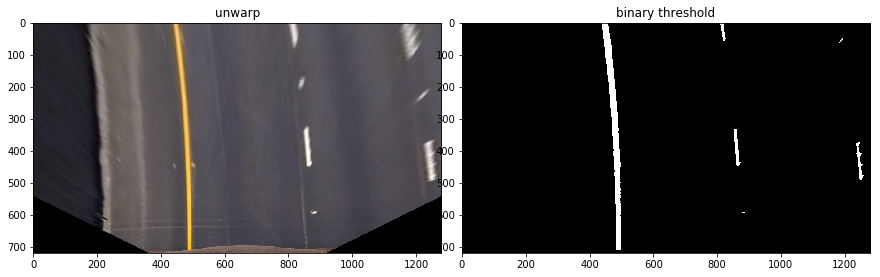

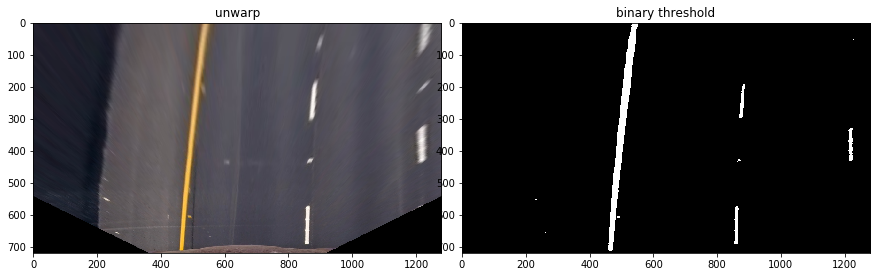

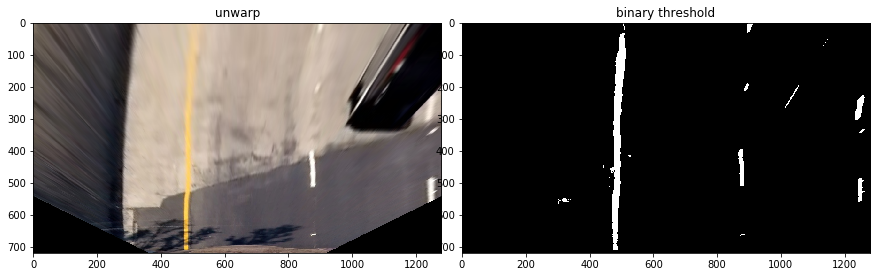

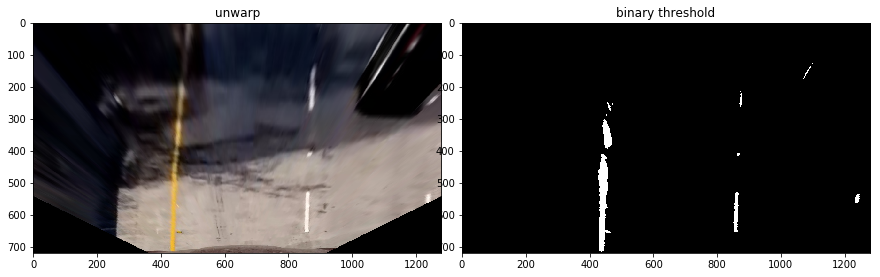

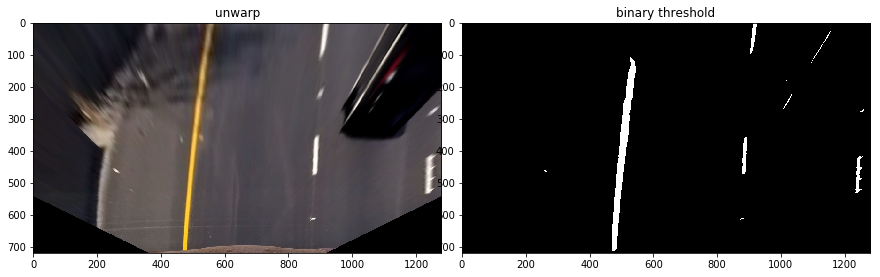

In [34]:
def plot_binary(image):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 8))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(image)
    ax1.set_title('unwarp')
    binary_img = binary_thresh(image)
    ax2.imshow(binary_img, cmap='gray')
    ax2.set_title('binary threshold')

for img in UNWARP_IMGS:
    plot_binary(img)